In [ ]:
pip install vaderSentiment

In [1]:
import pandas as pd
import string
import nltk
from nltk import tokenize


from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
sa = SentimentIntensityAnalyzer()

In [ ]:
nltk.download('opinion_lexicon')

In [40]:
df = pd.read_csv(r'C:\Users\rajjr\PycharmProjects\growth_hacking\chapter_2\review_corpus.tsv', sep='\t') 
df['score'] = 0.00    
print(df.head())


   rating                                             review  score
0     1.0  Yet another garbage CoD game. Zombies is unpla...    0.0
1     1.0  $80? .... No way. This is NOT worth $80. $80?....    0.0
2     1.0  One of the worst games ever. I bought and down...    0.0
3     1.0  I did a lot of homework before I decided to by...    0.0
4     1.0  I am really into RPG games, I loved Skyrim, Bo...    0.0


In [30]:
print(df.shape)

(5000, 2)


In [15]:
def tokenizer(sentence):
    # there are some issues with missing data
    if type(sentence) == str:
        tokens = tokenize.word_tokenize(sentence)
        print(tokens)

        return tokens
    
    

In [31]:
result = [tokenizer(sentence) for sentence in df['review']]

['Yet', 'another', 'garbage', 'CoD', 'game', '.', 'Zombies', 'is', 'unplayable', 'because', 'they', "'re", 'too', 'cheap', 'to', 'give', 'us', 'dedicated', 'servers', '.', 'Someone', 'leaves', '?', 'GG', 'because', 'everyone', 'is', 'getting', 'DC', "'d", '.', 'Jetpacks', 'are', 'back', 'and', 'just', 'as', 'lame', 'and', 'boring', 'as', 'ever', '.', 'Advanced', 'Warfare', '2', '.']
['$', '80', '?', '....', 'No', 'way', '.', 'This', 'is', 'NOT', 'worth', '$', '80', '.', '$', '80', '?', '....', 'No', 'way', '.', 'This', '...']
['One', 'of', 'the', 'worst', 'games', 'ever', '.', 'I', 'bought', 'and', 'downloaded', 'this', 'from', 'PSN', '.', 'I', 'do', "n't", 'have', 'a', 'UPlay', 'account', '.', 'After', 'awhile', 'it', "'s", 'now', 'stuck', 'at', 'the', 'loading', 'screen', '.', 'This', 'is', 'just', 'ridiculous', '.', 'I', 'do', "n't", 'know', 'if', 'I', 'need', 'to', 'reset', 'the', 'whole', 'game', 'thereby', 'losing', 'my', 'progress', '.', 'Ubisoft', 'stinks', '.', 'This', 'is', '

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



['I', "'ve", 'been', 'playing', 'through', 'all', 'the', 'PS2', 'WWE', 'games', 'for', 'a', 'while', '.', 'I', 'started', 'on', '2008', 'with', 'a', 'friend', ',', 'and', 'went', 'forward', 'from', 'there', 'to', '2011', ',', 'now', 'I', "'ve", 'begun', 'going', 'backwards', ',', 'and', 'this', 'is', 'a', 'comparison', 'compared', 'to', 'the', 'other', '6', 'games', 'in', 'the', 'SvsR', 'series', '.', 'I', 'consider', 'SvR2006', 'to', 'be', 'the', 'most', 'unique', 'version', 'of', 'the', 'game', 'in', 'the', 'entire', 'series', '.', 'One', 'being', 'it', 'has', 'what', 'I', 'think', 'is', 'the', 'coolest', 'arena', ',', 'so', 'a', 'big', 'thumbs', 'up', ',', 'and', 'the', 'other', 'being', 'it', 'is', 'the', 'only', 'version', 'that', 'does', 'not', 'have', 'a', 'one', 'button', 'way', 'to', 'execute', 'an', 'Irish', 'Whip', ';', 'which', 'is', 'not', 'hard', 'to', 'work', 'out', 'and', 'preform', ',', 'but', 'it', 'is', 'weird', 'that', 'it', 'was', 'a', 'one', 'button', 'execution',

In [17]:
def sent_tokenizer(review):
    sentences = tokenize.sent_tokenize(review)
    return sentences

In [85]:
from collections import Counter
from nltk.sentiment.util import mark_negation
ratings = []
scores = []

for index, row in df.iterrows():
    
    if type(row['review']) == str:
        ratings.append(row['rating'])
        sentences = sent_tokenizer(row['review'])
        
        # init some variables
        aggregate = 0.0
        count = 0
        
        for sentence in sentences:
            count += 1
            negs = mark_negation(sentence)
#             print(negs)
            score = sa.polarity_scores(negs)
            aggregate += score['compound']
            
#         one score for the whole review
        scores.append(aggregate/count)
  
df_combined = pd.DataFrame({"rating": ratings, "sentiment": scores})
print(df_combined)

      rating  sentiment
0        1.0   0.038150
1        1.0  -0.126917
2        1.0  -0.277456
3        1.0   0.169600
4        1.0  -0.194492
...      ...        ...
4995     5.0   0.790600
4996     5.0   0.571900
4997     5.0   0.270608
4998     5.0   0.250267
4999     5.0   0.101150

[5000 rows x 2 columns]


In [72]:
pip install altair_viewer

  Created wheel for portpicker: filename=portpicker-1.3.1-py3-none-any.whl size=13669 sha256=7a3b58935d3bcf7bedcbceb1ac2eece5bbb96308809068b4f2f58fb32785fb2f
  Stored in directory: c:\users\rajjr\appdata\local\pip\cache\wheels\79\41\b5\c922618972ef3ad0bfa030d39016537cd9f915918bd72b8bbe
Successfully built portpicker
Note: you may need to restart the kernel to use updated packages.


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x0000019BF0163250>]],
      dtype=object)

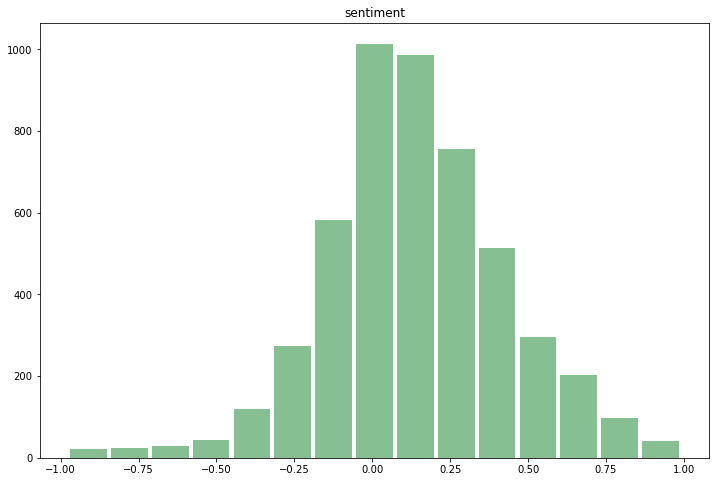

In [86]:
# df_combined.hist(column='score')
df_combined.hist(column='sentiment', bins=15, grid=False, figsize=(12,8), color='#86bf91', zorder=2, rwidth=0.9)

In [74]:
import altair as alt
alt.renderers.enable('altair_viewer')

comparison = alt.Chart(df_combined).mark_circle(size=80).encode(x="rating", y="sentiment", color='rating')
comparison.show()

Displaying chart at http://localhost:16913/


In [27]:

ratings = []
scores = []
for review in df['review']:
    
    if type(review) == str:
        sentences = sent_tokenizer(review)
        ratings.append()
        for sentence in sentences:
            scores = sa.polarity_scores(sentence)
            values.append(scores['compound'])
            print('{:+}: {}'.format(scores['compound'], sentence))
        
# df_scores = pd.DataFrame(values)
# print(df_scores.head())
# # df['scores'] = values
# # df.insert(1, "score", values, True) 
# df = pd.concat([df, df_scores])
print(df.head())

+0.0: Yet another garbage CoD game.
+0.4588: Zombies is unplayable because they're too cheap to give us dedicated servers.
+0.0: Someone leaves?
+0.4466: GG because everyone is getting DC'd.
-0.6249: Jetpacks are back and just as lame and boring as ever.
-0.0516: Advanced Warfare 2.
+0.0: $80?
-0.296: .... No way.
-0.1695: This is NOT worth $80.
+0.0: $80?....
-0.296: No way.
+0.0: This ...
-0.6249: One of the worst games ever.
+0.0: I bought and downloaded this from PSN.
+0.0: I don't have a UPlay account.
-0.25: After awhile it's now stuck at the loading screen.
-0.3612: This is just ridiculous.
+0.0516: I don't know if I need to reset the whole game thereby losing my progress.
-0.25: Ubisoft stinks.
-0.4767: This is worse than Driveclub.
-0.5859: Waste of money as my copy is stuck at loading screen forever
+0.0: I did a lot of homework before I decided to by the Tritton ax pro headset.
+0.7906: They were the best pick because of the 5.1 true surround sound.
+0.4939: Everything was g

In [ ]:
for review in df['review']:
    review.lower()
    sentences = sent_tokenizer(review)
    count = 0
    score = 0
    for sentence in sentences:
        scores_mc = sa.polarity_scores(sentence)
        
        sentence = sentence.translate(str.maketrans('', '', string.punctuation)).lower()
        print(sentence)
#         print(scores_mc)
        
        
        scores = sa.polarity_scores(sentence)
#         print(scores)
        print((scores['compound'] - scores_mc['compound']))
        
        score = score + scores['compound']
        count = count + 1
#         print(sentence)
#         print(scores)
        
    aggregate = score / count
#     print('{:+}: {}'.format(aggregate, review))
#         print('{:+}: {}'.format(scores['compound'], sentence))